In [1]:
import os 
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

In [2]:
WORKDIR = Path('./')
DATADIR = Path('./data')

## Tl;DR

### Same person

42, 131 → same person, 42 real, 131 fake

10 and 780, 941, 1104 same person, all fake - 864 real

698, 641, 694 → all fake

299, 343 both real

246, 454, both fake - 657 real

### Same video

316, 1, 551 → same video; 316, 551 exactly same and real; 1 is fake

755, 738 → same video, 738 zoomed in a bit. Both fake

693, 674 → same video, but 674 is upside down. Both real

### Exactly Same

249, 251 exactly the same, both fake

334, 418 both fake

694, 641, both fake - 244 is real.

In [3]:
os.chdir(WORKDIR)
!pwd

/home/nhtlong/playground/zalo-ai/liveness-detection


In [4]:
KEYFRAME_DIR = DATADIR / 'train' /'keyframes'

In [20]:
label_name = {
    0: 'FAKE',
    1: 'REAL'
}

label_df = pd.read_csv(DATADIR / 'train' / 'labels_video.csv')
label_df.head()

,filename,label
0,1.mp4,0
1,2.mp4,1
2,3.mp4,1
3,5.mp4,0
4,7.mp4,1


In [17]:
list(KEYFRAME_DIR.glob('*.jpg'))[:3]

[PosixPath('data/train/keyframes/1250-00042.jpg'),
 PosixPath('data/train/keyframes/1715-00142.jpg'),
 PosixPath('data/train/keyframes/113-00005.jpg')]

In [36]:
def viz_thumbnails(keyframe_dir, video_ids, n_rows=1, n_cols=5, figsize=(20, 10)):
    n_cols = len(video_ids)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    for i, video_id in enumerate(video_ids):
        if n_rows == 1:
            ax = axes[i]
        else:
            ax = axes[i // n_cols, i % n_cols]
        img_path = list(keyframe_dir.glob(f'{video_id}-*.jpg'))[0]
        label = label_name[label_df[label_df['filename'] == f'{video_id}.mp4']['label'].values[0]]
        img = plt.imread(img_path)
        ax.imshow(img)
        ax.set_title(f'{video_id} - {label}')
        ax.axis('off')
    plt.show()

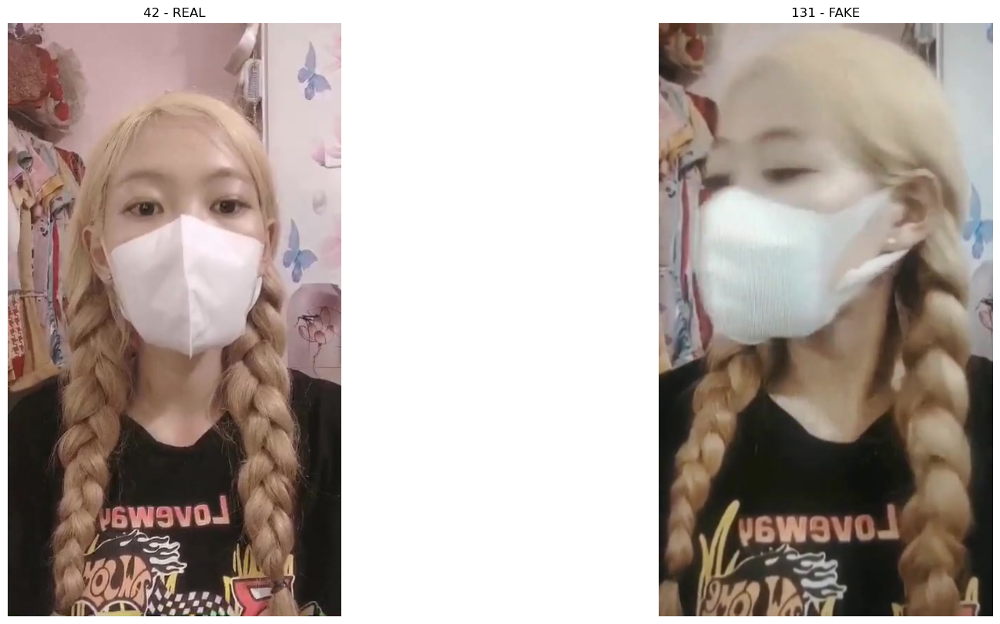

In [37]:
viz_thumbnails(KEYFRAME_DIR, [42, 131])

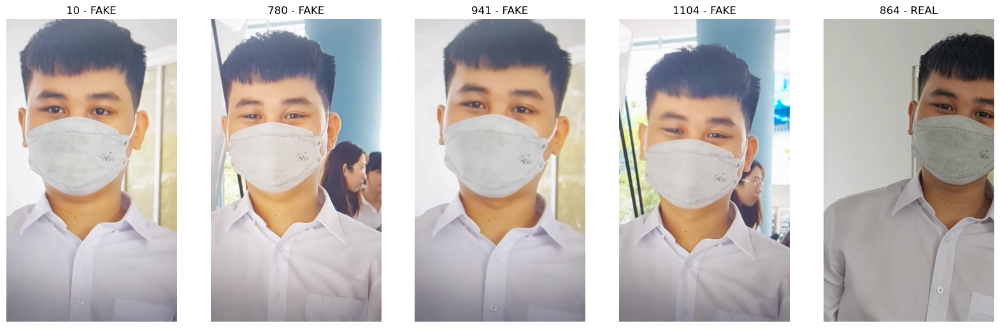

In [38]:
viz_thumbnails(KEYFRAME_DIR, [10, 780, 941, 1104, 864])

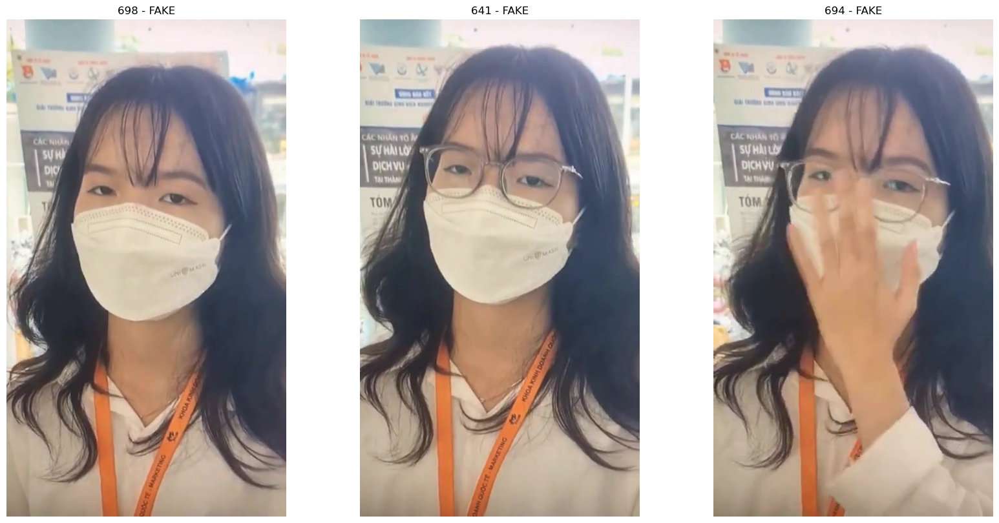

In [39]:
viz_thumbnails(KEYFRAME_DIR, [698, 641, 694])

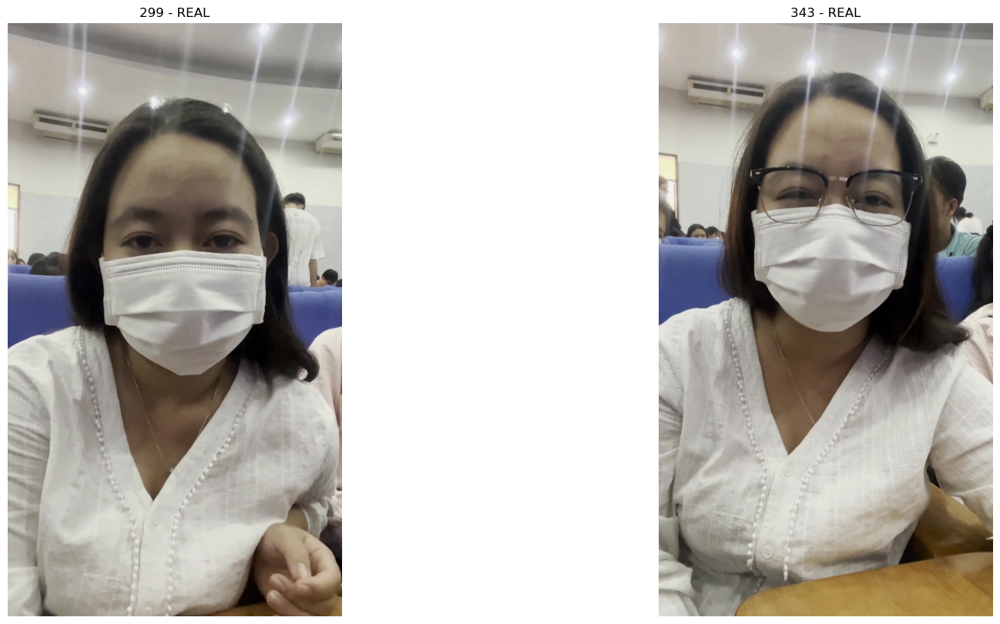

In [40]:
viz_thumbnails(KEYFRAME_DIR, [299, 343])

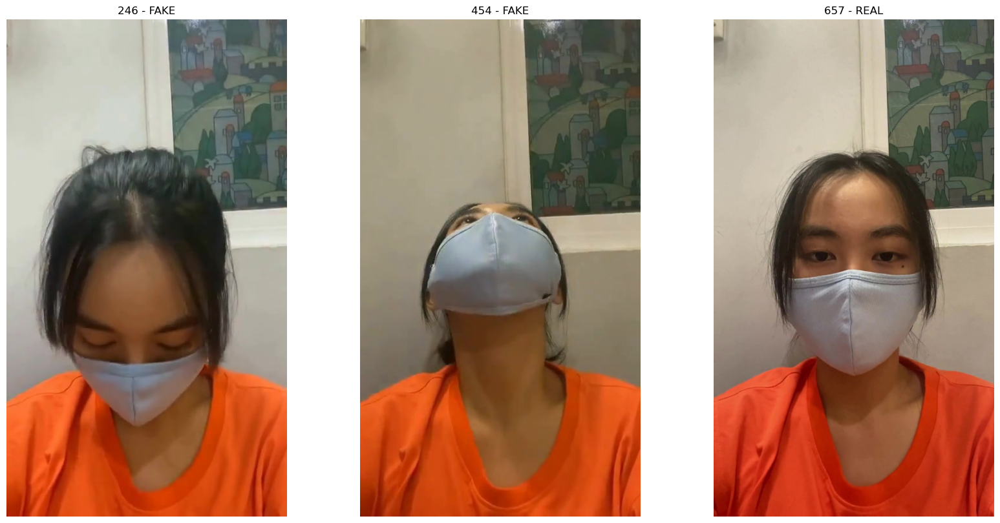

In [41]:
viz_thumbnails(KEYFRAME_DIR, [246, 454, 657])

## Same Video

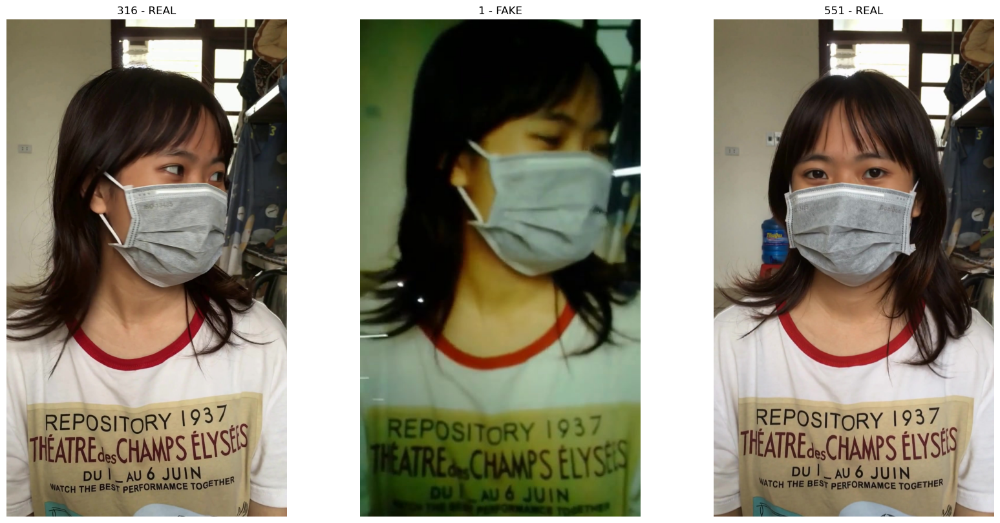

In [42]:
viz_thumbnails(KEYFRAME_DIR, [316, 1, 551])

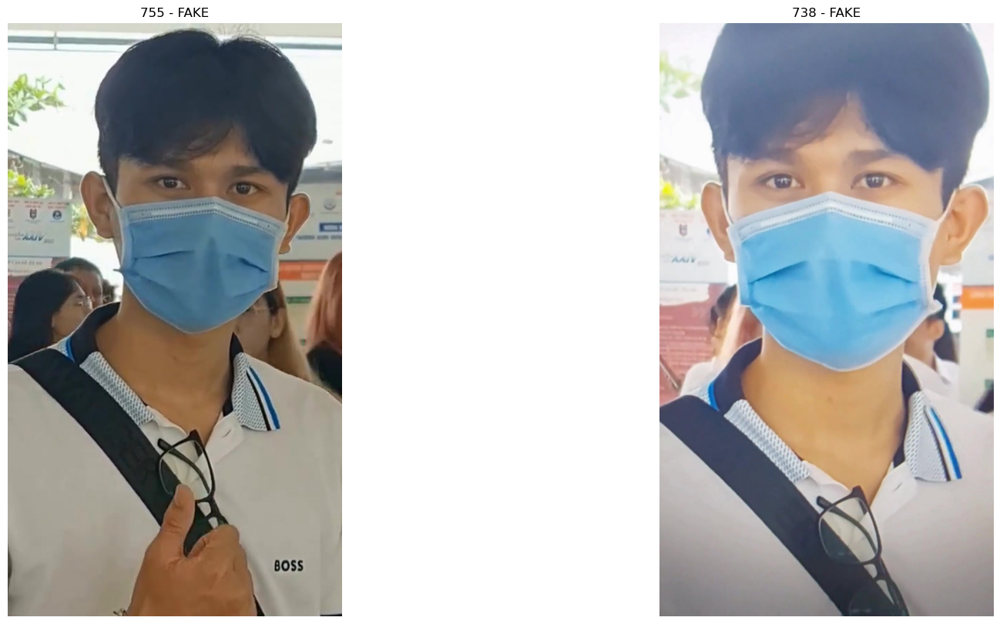

In [43]:
viz_thumbnails(KEYFRAME_DIR, [755, 738])

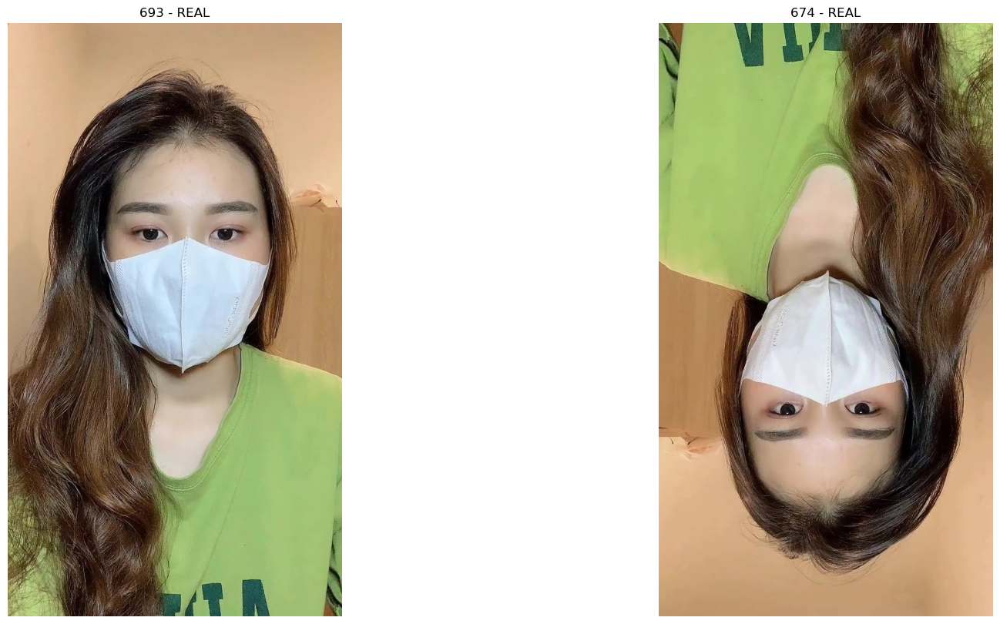

In [44]:
viz_thumbnails(KEYFRAME_DIR, [693, 674])

## Exactly same videos

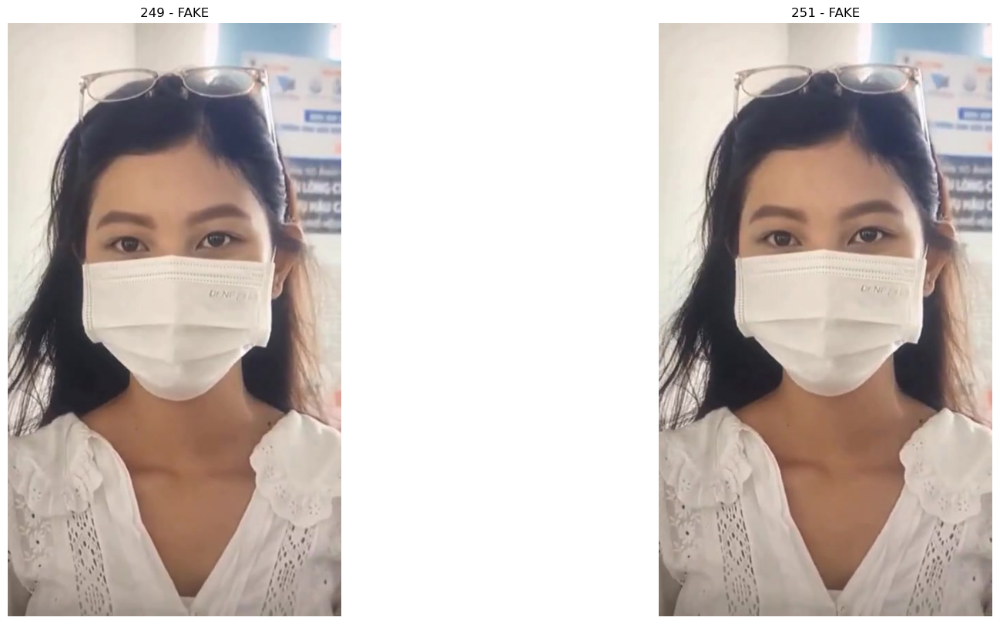

In [45]:
viz_thumbnails(KEYFRAME_DIR, [249, 251])

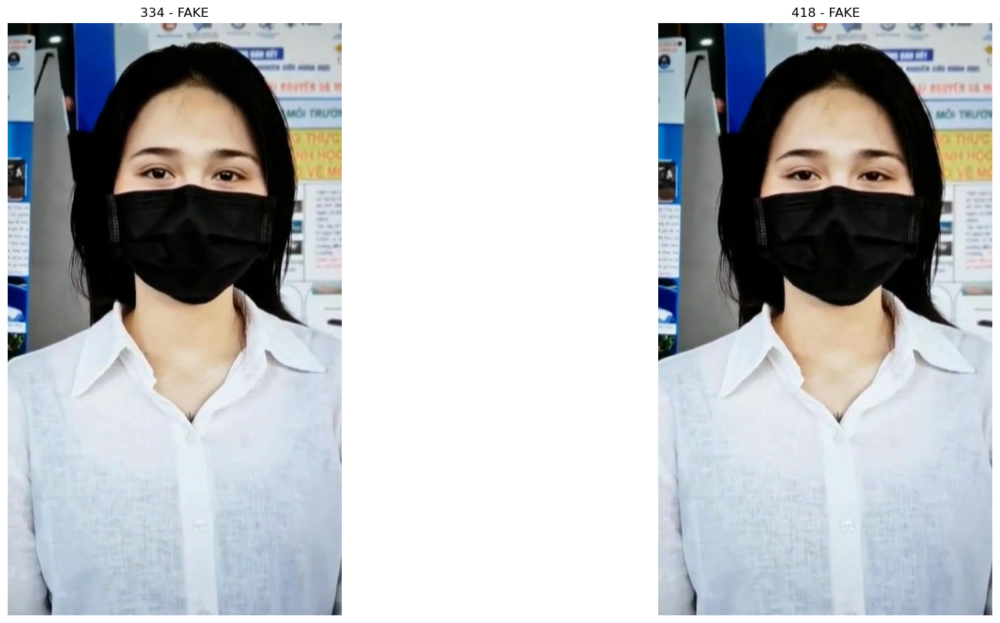

In [46]:
viz_thumbnails(KEYFRAME_DIR, [334, 418])

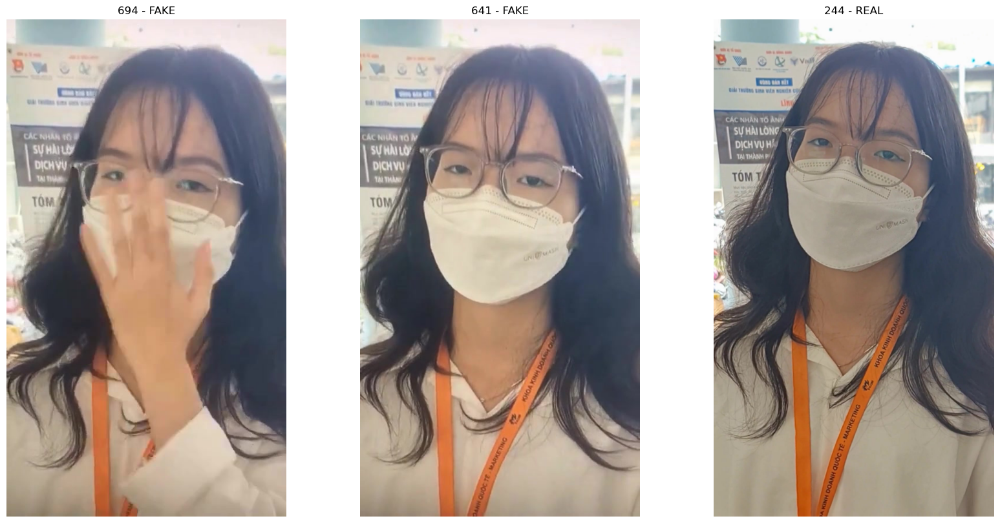

In [48]:
viz_thumbnails(KEYFRAME_DIR, [694, 641, 244])

## Wrong rotation videos

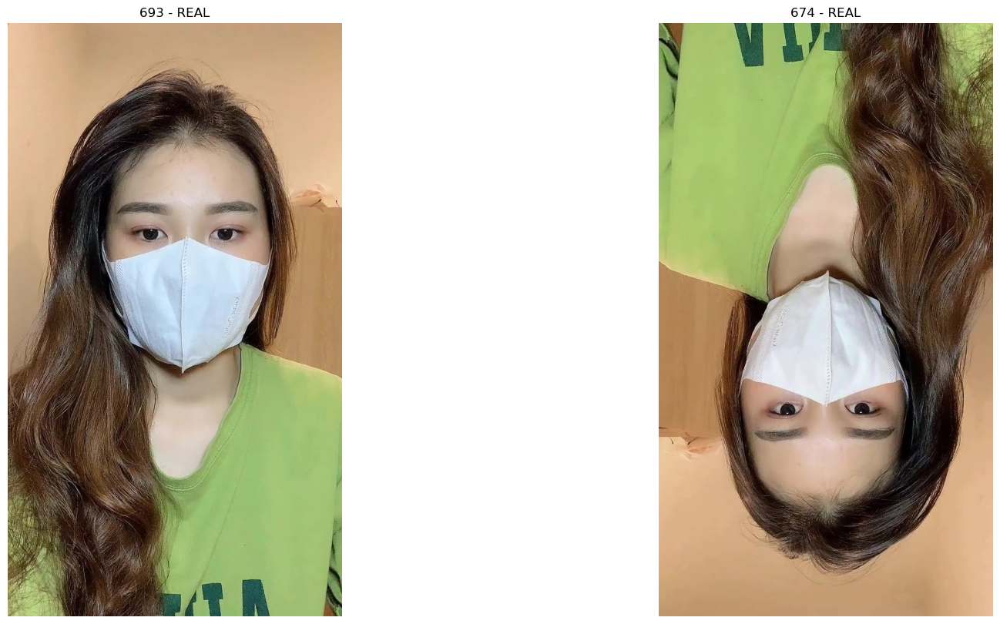

In [49]:
viz_thumbnails(KEYFRAME_DIR, [693, 674])